<a href="https://colab.research.google.com/github/bmericskay/GeoPandas/blob/main/Seance4_AnalyseSpatiale_Urbanisme.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📒 Séance 4 - Analyse spatiale de données urbanistiques  🌐 🏬

**Mettre en place des chaînes de traitements documentées automatisées et reproductibles**


* Jointure spatiales et agrégations spatiales
* Opérateur de recouvrement (intersect, difference, union,...)
* Analyses de recouvrement
* Création d'index spatial
* Analyse spatiale à différentes échelles
* Travailler avec un volume important de données (plusieurs millions d'entités spatiales sur un département)

## Configuration environnement de travail

In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal
# Install rtree - Geopandas requirment
!apt install python3-rtree
# Install Geopandas
!pip install geopandas
# Install Fiona
!pip install Fiona
# Instal contextily (fonds de carte)
!pip install contextily
# Install mapclassify (cartographie thématique)
!pip install mapclassify
#Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos
# Pour la cartographie interactive
!pip install folium
# Install scalebar
!pip install matplotlib_scalebar

In [ ]:
#Importation des librairies nécessaires
import pandas as pd #Gestion de données
import matplotlib.pyplot as plt #Visualisation de données
import geopandas as gpd #Gestion données spatiales
import pygeos #Opérations sur les géométrie de données spatiales
import contextily as ctx #Fonds de carte
import fiona as np #lecture et écriture de données spatiales
import numpy as np #Manipulation de tableaux
import shapely #Manipulation de géométrie
import folium #Cartographie interactive
import mapclassify #Cartographie thématique
from matplotlib_scalebar.scalebar import ScaleBar #Echhelle cartographique


# Analyse spatiale avec des opérateurs métriques et de recouvrement

## Récupération et préparation des données

In [ ]:
#Téléchargement des datas depuis le site opendata de IDF Mobilité
!wget -O ArretsTC.geojson https://data.iledefrance-mobilites.fr/api/explore/v2.1/catalog/datasets/emplacement-des-gares-idf-data-generalisee/exports/geojson?lang=fr&timezone=Europe%2FBerlin

--2024-03-18 09:23:37--  https://data.iledefrance-mobilites.fr/api/explore/v2.1/catalog/datasets/emplacement-des-gares-idf-data-generalisee/exports/geojson?lang=fr
Resolving data.iledefrance-mobilites.fr (data.iledefrance-mobilites.fr)... 34.249.199.226, 34.248.20.69
Connecting to data.iledefrance-mobilites.fr (data.iledefrance-mobilites.fr)|34.249.199.226|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘ArretsTC.geojson’

ArretsTC.geojson        [   <=>              ] 611.31K  1.44MB/s    in 0.4s    

2024-03-18 09:23:39 (1.44 MB/s) - ‘ArretsTC.geojson’ saved [625982]



,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terrer,termetro,tertram,terval,exploitant,idf,principal,x,y,geometry
0,"{'lon': 2.6375907212580154, 'lat': 48.87520826...",2,Vaires-Torcy,None,None,68419,Vaires - Torcy,43211,Vaires - Torcy,A01844,...,0,0,0,0,SNCF,1,0,673418.2649,6.863970e+06,POINT (2.63759 48.87521)
1,"{'lon': 3.1249090221127025, 'lat': 48.95081998...",20,La Ferté-sous-Jouarre,None,None,68918,La Ferté-sous-Jouarre,43246,La Ferté-sous-Jouarre,A01844,...,0,0,0,0,SNCF,1,0,709148.4649,6.872325e+06,POINT (3.12491 48.95082)
2,"{'lon': 2.8251699343306536, 'lat': 48.64437362...",38,Verneuil-l'Etang,None,None,62471,Verneuil -l'Étang,47187,Verneuil-l'Étang,A01844,...,0,0,0,0,SNCF,1,0,687119.8299,6.838258e+06,POINT (2.82517 48.64437)


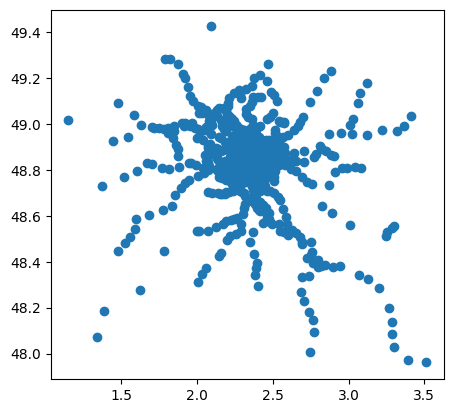

In [ ]:
#Importer la couche des arrêts de TC

ArretsTC= gpd.read_file("ArretsTC.geojson", encoding='utf-8')
ArretsTC = ArretsTC.to_crs(2154)
ArretsTC.plot()
ArretsTC.head(3)

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,y,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,surface,geometry
0,"{'lon': 2.3512922093345723, 'lat': 48.85755155...",101051,Hôtel de Ville,None,None,415852,Hôtel de Ville de Paris - 4ème Arrondissement,470524,Hôtel de Ville,A01534 / A01544,...,6.862142e+06,Saint-Merri 2,75104,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652403.286 6862141.611)
1,"{'lon': 2.353495740128162, 'lat': 48.861204989...",111053,Rambuteau,Centre Georges Pompidou,None,71273,Rambuteau,44593,Rambuteau,A01544,...,6.862547e+06,Saint-Merri 2,75104,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652568.285 6862546.516)
2,"{'lon': 2.3608035032752683, 'lat': 48.86651446...",103047,Temple,None,None,71296,Temple,44924,Temple,A01536,...,6.863133e+06,Arts et Metiers 3,75103,903,H,751030903,Paris 3e Arrondissement,75,0.070033,POINT (653109.197 6863132.522)


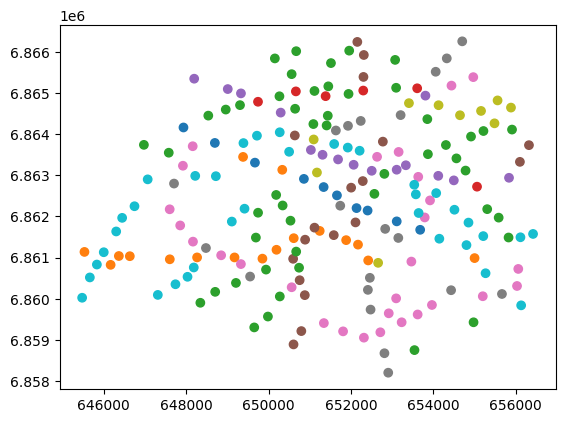

In [ ]:
# Ne garder que les arrêts de métro de Paris

Metros = ArretsTC[(ArretsTC["mode"] == 'METRO')]
Metros = gpd.overlay(Metros, IRIS, how='intersection')
Metros.plot(column='res_com')

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,y,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,surface,geometry
0,"{'lon': 2.3370964308572146, 'lat': 48.84003378...",432,Port Royal,None,None,71106,Port Royal,44500,Port Royal,A01857,...,6.860202e+06,Val de Grace 3,75105,1903,H,751051903,Paris 5e Arrondissement,75,0.063429,POINT (651345.391 6860202.455)
1,"{'lon': 2.32675977444181, 'lat': 48.8603514330...",311,Musée d'Orsay,None,None,71269,Musée d'Orsay,45705,Musée d'Orsay,A01840,...,6.862468e+06,Saint-Thomas d'Aquin 8,75107,2508,A,751072508,Paris 7e Arrondissement,75,0.030761,POINT (650606.000 6862468.000)
2,"{'lon': 2.2898035182584997, 'lat': 48.85645721...",314,Champ de Mars,Tour Eiffel,None,73844,Champ de Mars Tour Eiffel,58757,Champ de Mars Tour Eiffel,A01840,...,6.862059e+06,Seine et Berges,75115,5999,D,751155999,Paris 15e Arrondissement,75,0.184921,POINT (647890.786 6862058.751)


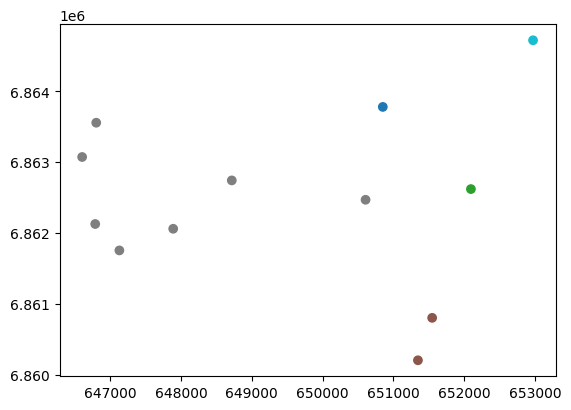

In [ ]:
# Ne garder que les arrêts de RER de Paris

RER = ArretsTC[(ArretsTC["mode"] == 'RER')]
RER = gpd.overlay(RER, IRIS, how='intersection')
RER.plot(column='res_com')

## Analyses de recouvrement

Documentation : https://geopandas.org/en/stable/docs/reference/api/geopandas.overlay.html

<Axes: >

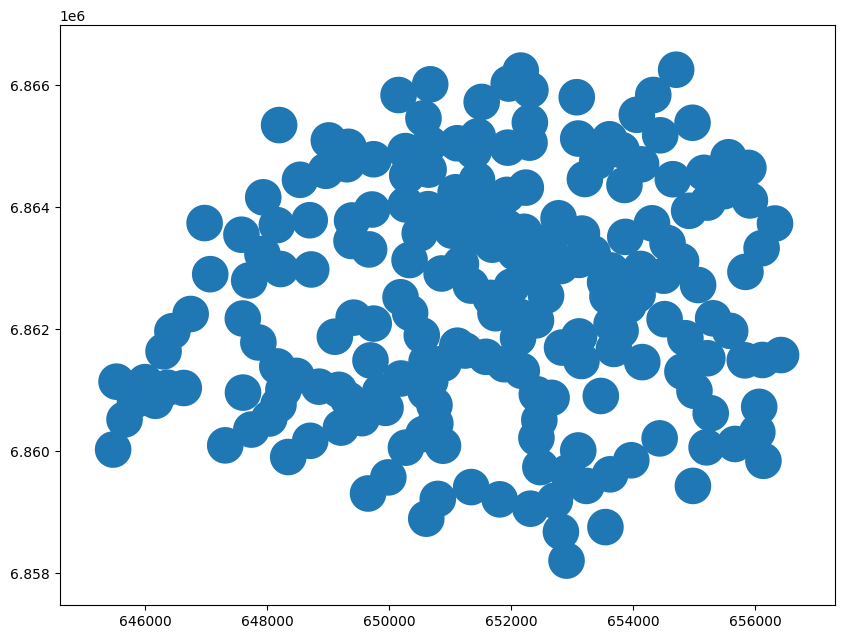

In [ ]:
# Buffer de 300m autour des métros

Metrosbuffer = Metros.copy()
Metrosbuffer['geometry'] = Metrosbuffer.geometry.buffer(300)
Metrosbuffer.plot(figsize=(10,10))

In [ ]:
#Grouper les buffers dans une seule entité spatiale
grouped_polygon = Metrosbuffer.unary_union
grouped_polygon.head()

AttributeError: 'MultiPolygon' object has no attribute 'head'

<Axes: >

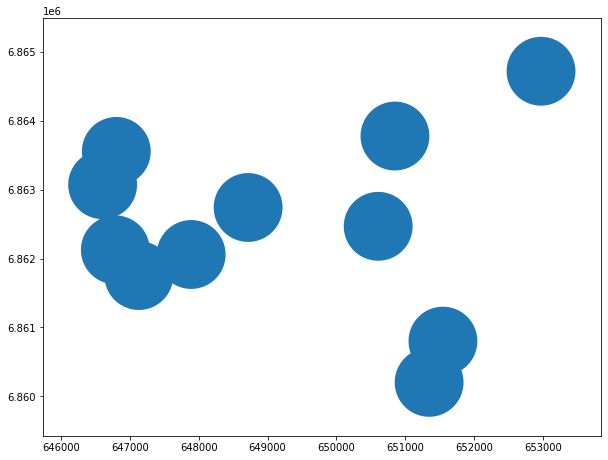

In [ ]:
# Buffer de 500m autour des RER

RERbuffer = RER.copy()
RERbuffer['geometry'] = RERbuffer.geometry.buffer(500)
RERbuffer.plot(figsize=(10,10))

<Axes: >

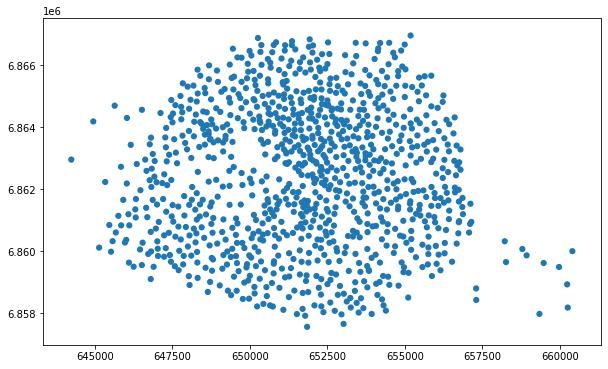

In [ ]:
# Buffer de 100m autour des vélibs

Velibsbuffer = VelibParis.copy()
Velibsbuffer['geometry'] = Velibsbuffer.geometry.buffer(100)
Velibsbuffer.plot(figsize=(10,10))

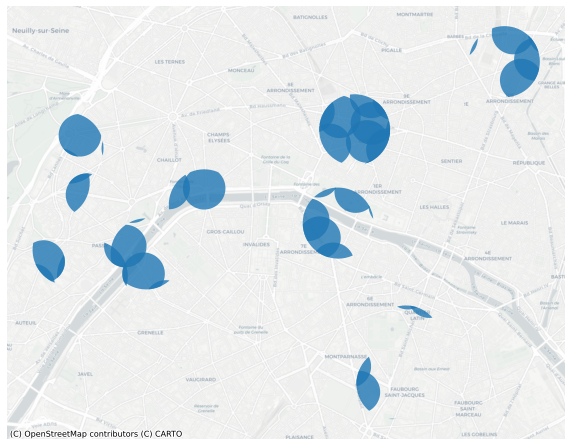

In [ ]:
# INTERSECTION des zones à moins de 500m d'une station de RER et à moins de 300m d'une station de métro

Intersect = gpd.overlay(RERbuffer, Metrosbuffer, how='intersection')

MapIntersect, ax = plt.subplots(figsize=(10,10))
Intersect.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8,)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

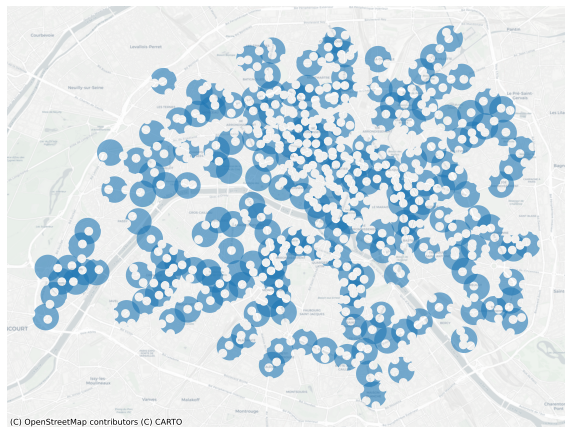

In [ ]:
# DIFFERENCE des zones tampons de buffer par les zones tampons des vélibs

Difference = gpd.overlay(Metrosbuffer, Velibsbuffer, how='difference')

MapDifference, ax = plt.subplots(figsize=(10,10))
Difference.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

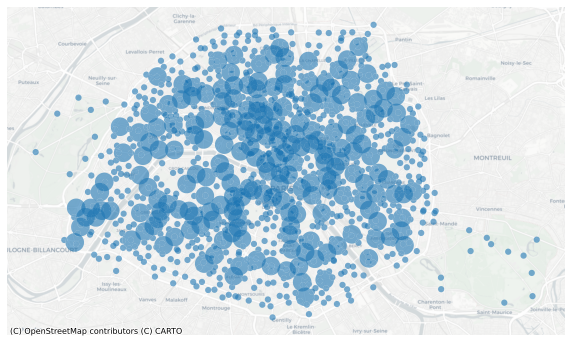

In [ ]:
# UNION des zones tampons des métros et des vélibs

Union = gpd.overlay(Metrosbuffer, Velibsbuffer, how='union')

MapUnion, ax = plt.subplots(figsize=(10,10))
Union.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

## Analyse du plus proche voisin

<Axes: >

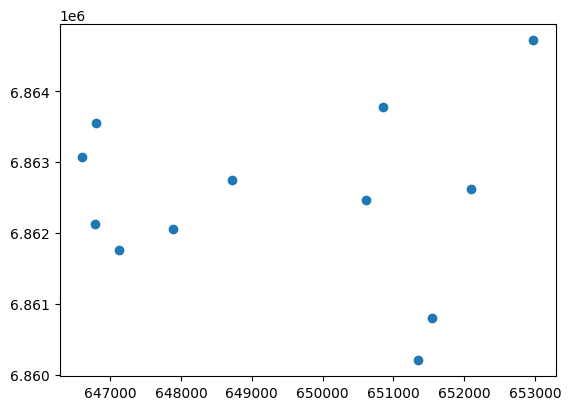

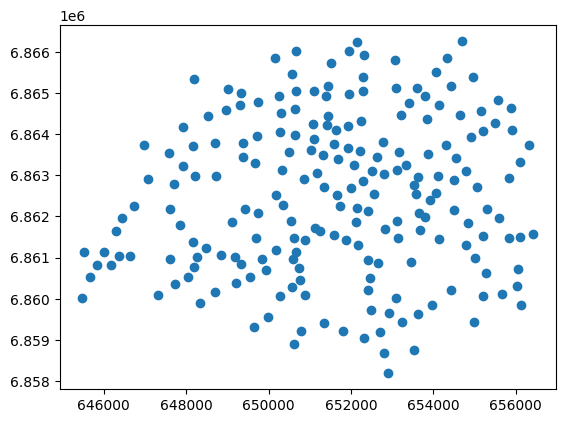

In [ ]:
# Affichage des stations de RER et de métro
RER.plot()
Metros.plot()

In [ ]:
#Calcul des distances

from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points

def get_nearest_values(row, other_gdf, point_column='geometry', value_column="geometry"):

    # Create an union of the other GeoDataFrame's geometries:
    other_points = other_gdf["geometry"].unary_union

    # Find the nearest points
    nearest_geoms = nearest_points(row[point_column], other_points)

    # Get corresponding values from the other df
    nearest_data = other_gdf.loc[other_gdf["geometry"] == nearest_geoms[1]]

    nearest_value = nearest_data[value_column].values[0]

    return nearest_value

In [ ]:
#Union des RER

unary_union = RER.unary_union
print(unary_union)

MULTIPOINT (646605.4493990284 6863071.827694577, 646789.9999990317 6862125.999894574, 646804.2191990319 6863555.73869458, 647131.0083990386 6861753.257094569, 647890.7858990484 6862058.750594573, 648717.6548990662 6862741.393094575, 650605.999999101 6862467.999894575, 650849.518699109 6863778.762494583, 651345.3911991133 6860202.455394561, 651546.1124991153 6860801.280494564, 652093.2251991255 6862619.066394577, 652970.1853991456 6864719.449594591)


In [ ]:
#Ajouter une colonne avec les coordonnées de la gare RER la plus proche

Metros["nearest_loc"] = Metros.apply(get_nearest_values, other_gdf=RER, axis=1)
Metros.head(2)

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,surface,geometry,nearest_loc
0,"{'lon': 2.3512922093345723, 'lat': 48.85755155...",101051,Hôtel de Ville,None,None,415852,Hôtel de Ville de Paris - 4ème Arrondissement,470524,Hôtel de Ville,A01534 / A01544,...,Saint-Merri 2,75104,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652403.286 6862141.611),POINT (652093.225 6862619.066)
1,"{'lon': 2.353495740128162, 'lat': 48.861204989...",111053,Rambuteau,Centre Georges Pompidou,None,71273,Rambuteau,44593,Rambuteau,A01544,...,Saint-Merri 2,75104,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652568.285 6862546.516),POINT (652093.225 6862619.066)


In [ ]:
#Ajouter une colonne avec le nom de la gare RER la plus proche

Metros["nearest_stations"] = Metros.apply(get_nearest_values, other_gdf=RER, value_column="nom_long", axis=1)
Metros.head(2)

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,insee_com,iris,typ_iris,code_iris,nom_com,dep,surface,geometry,nearest_loc,nearest_stations
0,"{'lon': 2.3512922093345723, 'lat': 48.85755155...",101051,Hôtel de Ville,None,None,415852,Hôtel de Ville de Paris - 4ème Arrondissement,470524,Hôtel de Ville,A01534 / A01544,...,75104,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652403.286 6862141.611),POINT (652093.225 6862619.066),Châtelet-Les Halles
1,"{'lon': 2.353495740128162, 'lat': 48.861204989...",111053,Rambuteau,Centre Georges Pompidou,None,71273,Rambuteau,44593,Rambuteau,A01544,...,75104,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652568.285 6862546.516),POINT (652093.225 6862619.066),Châtelet-Les Halles


In [ ]:
# Créer une nouvelle colonne de géométrie à partir des couples de coordonnées

from shapely.geometry import LineString

Metros['line'] = Metros.apply(lambda row: LineString([row['geometry'], row['nearest_loc']]), axis=1)# Create Line Geodataframe
line_gdf = Metros[["nom_long", "nearest_stations", "line"]].set_geometry('line')# Set the Coordinate reference
line_gdf.crs = crs={"init":"epsg:2154"}
Metros.head(3)

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,iris,typ_iris,code_iris,nom_com,dep,surface,geometry,nearest_loc,nearest_stations,line
0,"{'lon': 2.3512922093345723, 'lat': 48.85755155...",101051,Hôtel de Ville,None,None,415852,Hôtel de Ville de Paris - 4ème Arrondissement,470524,Hôtel de Ville,A01534 / A01544,...,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652403.286 6862141.611),POINT (652093.225 6862619.066),Châtelet-Les Halles,"LINESTRING (652403.286 6862141.611, 652093.225..."
1,"{'lon': 2.353495740128162, 'lat': 48.861204989...",111053,Rambuteau,Centre Georges Pompidou,None,71273,Rambuteau,44593,Rambuteau,A01544,...,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652568.285 6862546.516),POINT (652093.225 6862619.066),Châtelet-Les Halles,"LINESTRING (652568.285 6862546.516, 652093.225..."
2,"{'lon': 2.3608035032752683, 'lat': 48.86651446...",103047,Temple,None,None,71296,Temple,44924,Temple,A01536,...,903,H,751030903,Paris 3e Arrondissement,75,0.070033,POINT (653109.197 6863132.522),POINT (652093.225 6862619.066),Châtelet-Les Halles,"LINESTRING (653109.197 6863132.522, 652093.225..."


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,iris,typ_iris,code_iris,nom_com,dep,surface,geometry,nearest_loc,nearest_stations,line
0,"{'lon': 2.3512922093345723, 'lat': 48.85755155...",101051,Hôtel de Ville,None,None,415852,Hôtel de Ville de Paris - 4ème Arrondissement,470524,Hôtel de Ville,A01534 / A01544,...,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652403.286 6862141.611),POINT (652093.225 6862619.066),Châtelet-Les Halles,"LINESTRING (652403.286 6862141.611, 652093.225..."
1,"{'lon': 2.353495740128162, 'lat': 48.861204989...",111053,Rambuteau,Centre Georges Pompidou,None,71273,Rambuteau,44593,Rambuteau,A01544,...,1302,H,751041302,Paris 4e Arrondissement,75,0.106268,POINT (652568.285 6862546.516),POINT (652093.225 6862619.066),Châtelet-Les Halles,"LINESTRING (652568.285 6862546.516, 652093.225..."
2,"{'lon': 2.3608035032752683, 'lat': 48.86651446...",103047,Temple,None,None,71296,Temple,44924,Temple,A01536,...,903,H,751030903,Paris 3e Arrondissement,75,0.070033,POINT (653109.197 6863132.522),POINT (652093.225 6862619.066),Châtelet-Les Halles,"LINESTRING (653109.197 6863132.522, 652093.225..."


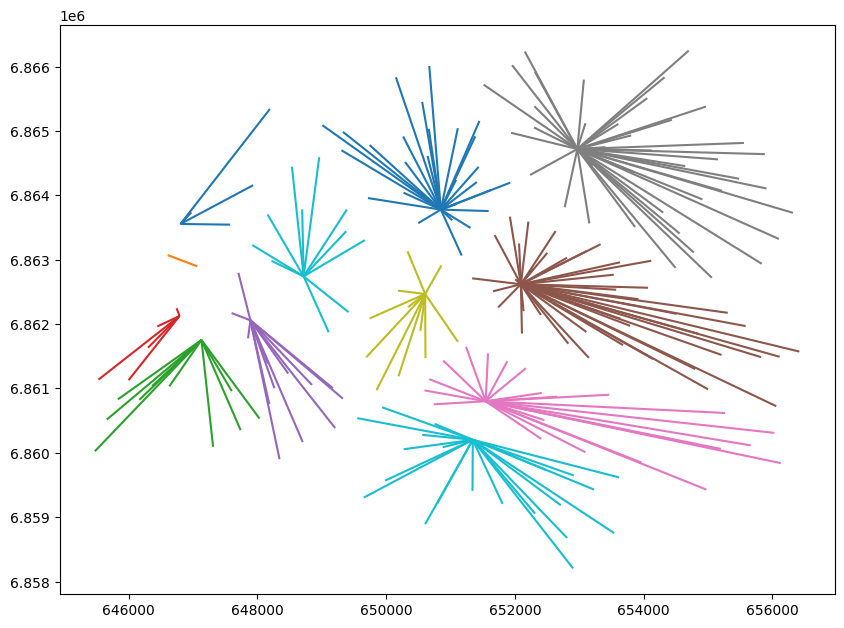

In [ ]:
#Générer une nouvelle couche de lignes

LinkMetroRer = Metros.copy()
LinkMetroRer = LinkMetroRer.set_geometry('line', crs=2154)
LinkMetroRer.plot(figsize =(10,10), column = 'nearest_stations')
LinkMetroRer.head(3)

In [ ]:
LinkMetroRer.crs

<Projected CRS: EPSG:2154>
Name: RGF93 v1 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France - onshore and offshore, mainland and Corsica (France métropolitaine including Corsica).
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993 v1
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

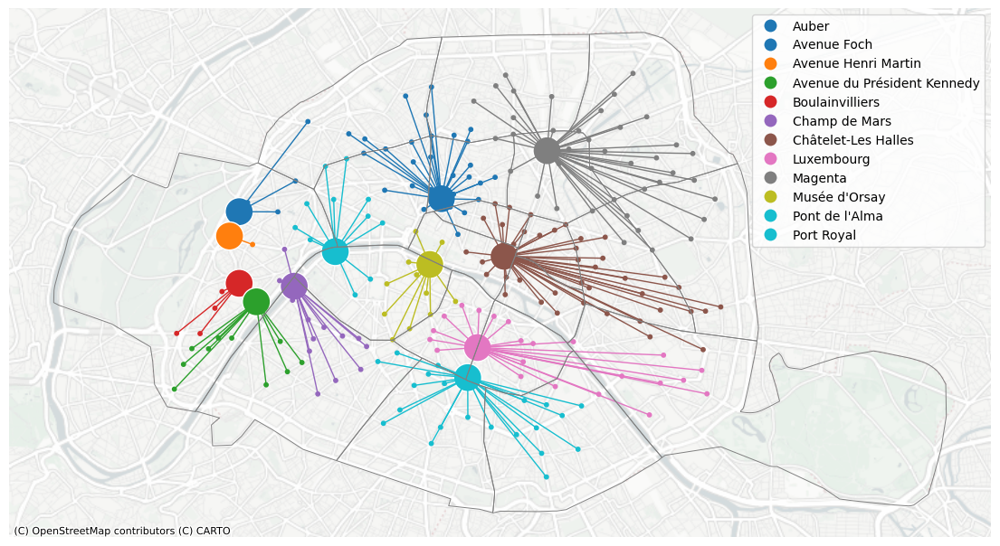

In [ ]:
#Faire une carte

Carteflux1, ax = plt.subplots(figsize=(14,14))

RER.to_crs('EPSG:3857').plot(ax=ax, markersize = 500, column = 'nom_long', edgecolor = "white", legend = True)
Metros.to_crs('EPSG:3857').plot(ax=ax, markersize = 10, column = 'nearest_stations')
LinkMetroRer.to_crs('EPSG:3857').plot(ax=ax, column = 'nearest_stations', linewidth=1)

ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.7, color = 'grey')
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.show()

## Exercice sur la proximité des stations de vélibs aux stations de métro

<Axes: >

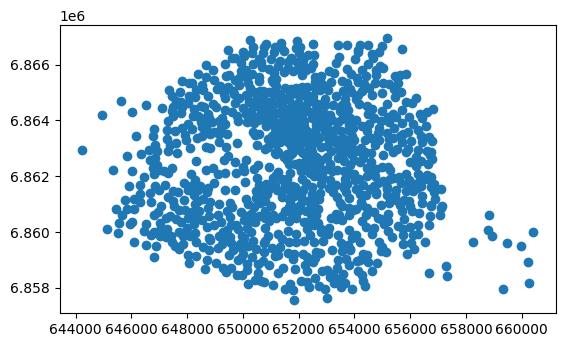

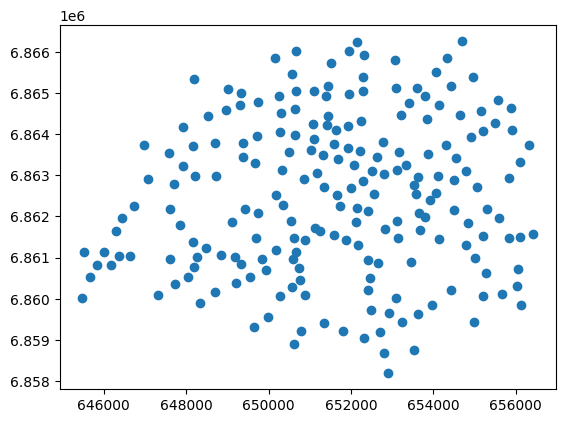

In [ ]:
#Créer un index spatial et Affichage des stations de vélibs et des stations de vélo

VelibParis.sindex
Metros.sindex

VelibParis.plot()
Metros.plot()

In [ ]:
#Calcul des distances

from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points

def get_nearest_values(row, other_gdf, point_column='geometry', value_column="geometry"):

    # Create an union of the other GeoDataFrame's geometries:
    other_points = other_gdf["geometry"].unary_union

    # Find the nearest points
    nearest_geoms = nearest_points(row[point_column], other_points)

    # Get corresponding values from the other df
    nearest_data = other_gdf.loc[other_gdf["geometry"] == nearest_geoms[1]]

    nearest_value = nearest_data[value_column].values[0]

    return nearest_value

In [ ]:
#Union des stations de métros

unary_union = Metros.unary_union
print(unary_union)

MULTIPOINT (645473.583799011 6860024.2595945615, 645529.7325990123 6861136.865594565, 645660.7070990078 6860517.507494562, 645831.3565990158 6860830.426694566, 645998.3062990168 6861129.316894572, 646165.0734990204 6860823.258894566, 646299.9368990201 6861633.692294572, 646364.8035990224 6861037.727594566, 646444.7924990221 6861963.832694572, 646631.0121990268 6861033.151594569, 646744.2365990275 6862245.8555945745, 646972.7505990375 6863736.128194582, 647064.7582990355 6862898.339794575, 647310.8392990405 6860093.293094562, 647576.3598990435 6863545.14769458, 647598.9540990442 6862171.634894574, 647601.6844990479 6860957.977194566, 647703.9745990504 6862796.195594577, 647739.0762990518 6860351.753394562, 647853.8594990494 6861779.460294571, 647920.0416990502 6863228.967594581, 647933.4301990552 6864157.790394586, 648031.846799054 6860532.900194564, 648157.7062990542 6863702.667394583, 648164.2589990601 6861386.582594571, 648183.5661990602 6860759.273794564, 648193.595899056 6865341.90

In [ ]:
#Ajouter une colonne dans la couche des vélibs avec les coordonnées de la station de métro la plus proche et une autre colonne avec le nom de la station de métro

VelibParis["nearest_loc"] = VelibParis.apply(get_nearest_values, other_gdf=Metros, axis=1)
VelibParis["nearest_stations"] = VelibParis.apply(get_nearest_values, other_gdf=Metros, value_column="nom_long", axis=1)
VelibParis.head(2)

,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude,geometry,Txdispo,Txoccupation,nearest_loc,nearest_stations
0,Benjamin Godard - Victor Hugo,16107,3,1,4,30,35,6.863127e+06,646867.547600,POINT (646867.548 6863127.314),85.714286,14.285714,POINT (647064.758 6862898.340),Rue de la Pompe
3,Mairie du 12ème,12109,1,5,6,23,30,6.860264e+06,655049.485913,POINT (655049.486 6860263.893),76.666667,23.333333,POINT (655199.490 6860061.002),Dugommier


In [ ]:
# Créer une nouvelle colonne de géométrie à partir des couples de coordonnées

from shapely.geometry import LineString

VelibParis['line'] = VelibParis.apply(lambda row: LineString([row['geometry'], row['nearest_loc']]), axis=1) # Create Line Geodataframe
line_gdf = VelibParis[["Code", "nearest_stations", "line"]].set_geometry('line', crs=2154) # Set the Coordinate reference
line_gdf.crs = crs={"init":"epsg:2154"}
VelibParis.head(3)

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude,geometry,Txdispo,Txoccupation,nearest_loc,nearest_stations,line
0,Benjamin Godard - Victor Hugo,16107,3,1,4,30,35,6.863127e+06,646867.547600,POINT (646867.548 6863127.314),85.714286,14.285714,POINT (647064.758 6862898.340),Rue de la Pompe,"LINESTRING (646867.548 6863127.314, 647064.758..."
3,Mairie du 12ème,12109,1,5,6,23,30,6.860264e+06,655049.485913,POINT (655049.486 6860263.893),76.666667,23.333333,POINT (655199.490 6860061.002),Dugommier,"LINESTRING (655049.486 6860263.893, 655199.490..."
4,Toudouze - Clauzel,9020,2,1,3,18,21,6.864568e+06,651401.378236,POINT (651401.378 6864567.904),85.714286,14.285714,POINT (651436.812 6864442.781),Saint-Georges,"LINESTRING (651401.378 6864567.904, 651436.812..."


,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude,geometry,Txdispo,Txoccupation,nearest_loc,nearest_stations,line
0,Benjamin Godard - Victor Hugo,16107,3,1,4,30,35,6.863127e+06,646867.547600,POINT (646867.548 6863127.314),85.714286,14.285714,POINT (647064.758 6862898.340),Rue de la Pompe,"LINESTRING (646867.548 6863127.314, 647064.758..."
3,Mairie du 12ème,12109,1,5,6,23,30,6.860264e+06,655049.485913,POINT (655049.486 6860263.893),76.666667,23.333333,POINT (655199.490 6860061.002),Dugommier,"LINESTRING (655049.486 6860263.893, 655199.490..."
4,Toudouze - Clauzel,9020,2,1,3,18,21,6.864568e+06,651401.378236,POINT (651401.378 6864567.904),85.714286,14.285714,POINT (651436.812 6864442.781),Saint-Georges,"LINESTRING (651401.378 6864567.904, 651436.812..."


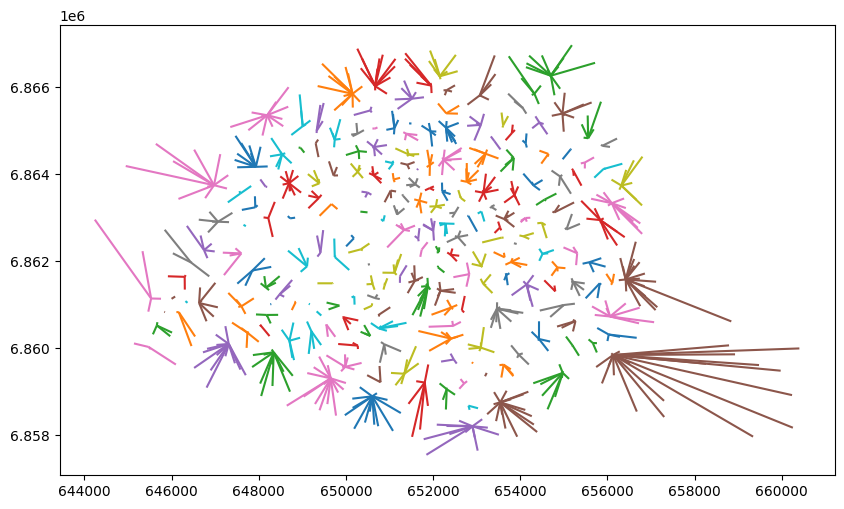

In [ ]:
#Générer une nouvelle couche de lignes

LinkVelibsMetro = VelibParis.copy()
LinkVelibsMetro = LinkVelibsMetro.set_geometry('line', crs=2154)
LinkVelibsMetro.plot(figsize =(10,10), column = 'nearest_stations')
LinkVelibsMetro.head(3)

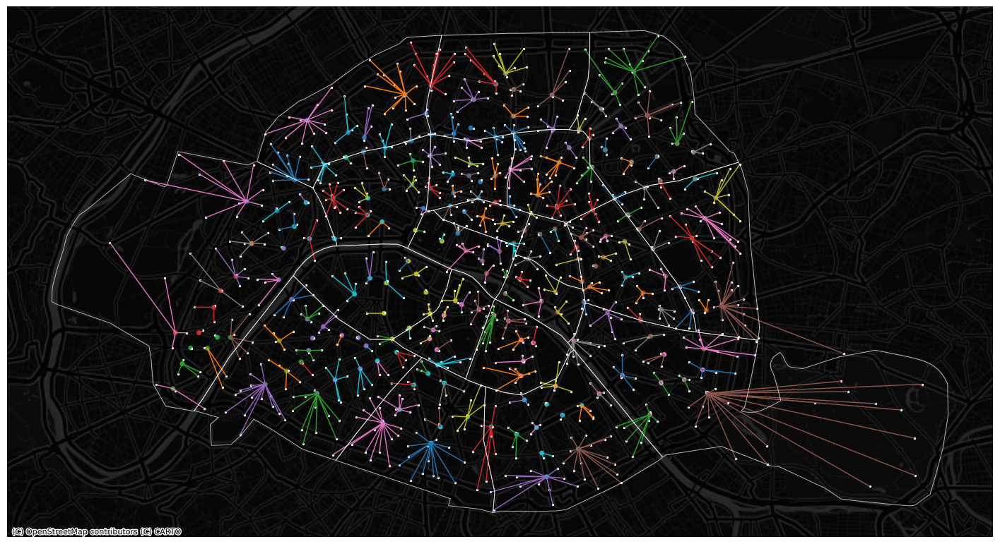

In [ ]:
#Faire une carte

Carteflux2, ax = plt.subplots(figsize=(18,16))

Metros.to_crs('EPSG:3857').plot(ax=ax, markersize = 15, column = 'nearest_stations')
LinkVelibsMetro.to_crs('EPSG:3857').plot(ax=ax, column = 'nearest_stations', linewidth=1)
VelibParis.to_crs('EPSG:3857').plot(ax=ax, markersize = 2, color = 'white')
ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.7, color = 'white', alpha=0.7)

ax.axis("off")
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatterNoLabels)

plt.show()

# Applicatif d'indicateurs urbanistiques à l'échelle d'une commune

## Importation des données (cadastre.data.gouv.fr)

Nous travaillons ici sur la commune de Cesson Sévigné (code insee 35051)

In [ ]:
#Téléchargement des datas depuis cadastre.data.gouv
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/batiments -O batiments.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/parcelles -O parcelles.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/sections -O sections.zip

--2024-03-19 08:39:19--  https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/batiments
Resolving cadastre.data.gouv.fr (cadastre.data.gouv.fr)... 54.36.212.78
Connecting to cadastre.data.gouv.fr (cadastre.data.gouv.fr)|54.36.212.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/x-shapefile]
Saving to: ‘batiments.zip’

batiments.zip           [   <=>              ] 966.13K  1.73MB/s    in 0.5s    

2024-03-19 08:39:21 (1.73 MB/s) - ‘batiments.zip’ saved [989316]

--2024-03-19 08:39:21--  https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/parcelles
Resolving cadastre.data.gouv.fr (cadastre.data.gouv.fr)... 54.36.212.78
Connecting to cadastre.data.gouv.fr (cadastre.data.gouv.fr)|54.36.212.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/x-shapefile]
Saving to: ‘parcelles.zip’

parcelles.zip           [   <=>              ]   1.33M  2.41MB/s   

,id,commune,prefixe,code,created,updated,geometry
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6..."
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6..."
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6..."


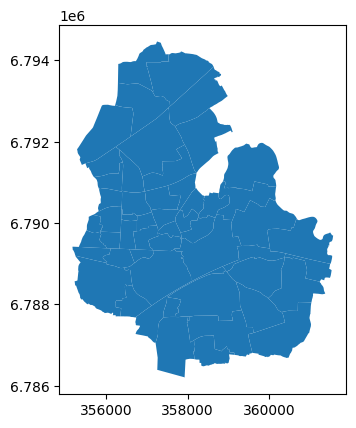

In [ ]:
#Chargement couche des Sections cadastrales

Sections= gpd.read_file("sections.zip", encoding='utf-8')
Sections.plot()
Sections.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6..."
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6..."
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2022-01-28,"POLYGON ((357515.617 6790355.263, 357541.619 6..."


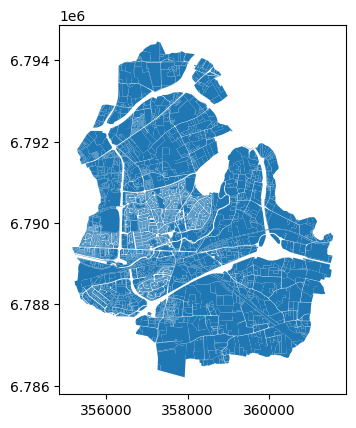

In [ ]:
#Chargement couche des Parcelles

Parcelles= gpd.read_file("parcelles.zip", encoding='utf-8')
Parcelles.plot()
Parcelles.head(3)

In [ ]:
#Compter le nombre de parcelles
len(Parcelles)

9162

,commune,nom,type,created,updated,geometry
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6..."


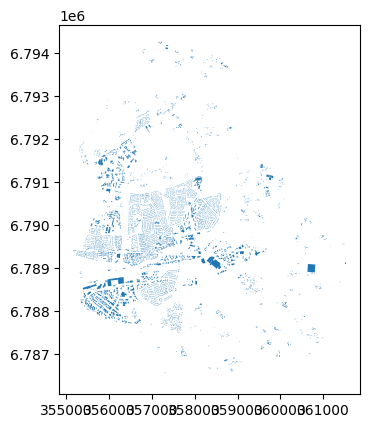

In [ ]:
#Chargement couche des Batiments

Batiments= gpd.read_file("batiments.zip", encoding='utf-8')
Batiments.plot()
Batiments.head(3)

In [ ]:
#Compter le nombre de batiments
len(Batiments)

9044

## Importation des données via l'API du GPU

--2024-03-19 08:39:39--  https://apicarto.ign.fr/api/gpu/zone-urba?partition=DU_243500139
Resolving apicarto.ign.fr (apicarto.ign.fr)... 57.128.40.173
Connecting to apicarto.ign.fr (apicarto.ign.fr)|57.128.40.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16346395 (16M) [application/json]
Saving to: ‘PLU.geojson’

PLU.geojson         100%[===================>]  15.59M  10.8MB/s    in 1.4s    

2024-03-19 08:39:46 (10.8 MB/s) - ‘PLU.geojson’ saved [16346395/16346395]



,id,gid,gpu_doc_id,gpu_status,gpu_timestamp,partition,libelle,libelong,typezone,destdomi,nomfic,urlfic,insee,datappro,datvalid,idurba,idzone,lib_idzone,geometry
0,zone_urba.fid--290cdf4c_18e55c529b6_1c1e,440146,337e5bcd3399cf123e31efe64e59893b,production,2023-05-02 22:30:13+00:00,DU_243500139,UE2d(d),None,U,None,243500139_reglement_20230406.pdf,https://public.sig.rennesmetropole.fr/ressourc...,None,None,20230406,243500139_PLUI_20230406,None,None,"MULTIPOLYGON (((342890.712 6789273.203, 342933..."
1,zone_urba.fid--290cdf4c_18e55c529b6_1c1f,463611,337e5bcd3399cf123e31efe64e59893b,production,2023-05-02 22:30:13+00:00,DU_243500139,A,None,A,None,243500139_reglement_20230406.pdf,https://public.sig.rennesmetropole.fr/ressourc...,None,None,20230406,243500139_PLUI_20230406,None,None,"MULTIPOLYGON (((336811.703 6791960.264, 336848..."
2,zone_urba.fid--290cdf4c_18e55c529b6_1c20,463612,337e5bcd3399cf123e31efe64e59893b,production,2023-05-02 22:30:13+00:00,DU_243500139,A,None,A,None,243500139_reglement_20230406.pdf,https://public.sig.rennesmetropole.fr/ressourc...,None,None,20230406,243500139_PLUI_20230406,None,None,"MULTIPOLYGON (((345067.640 6801093.030, 345095..."


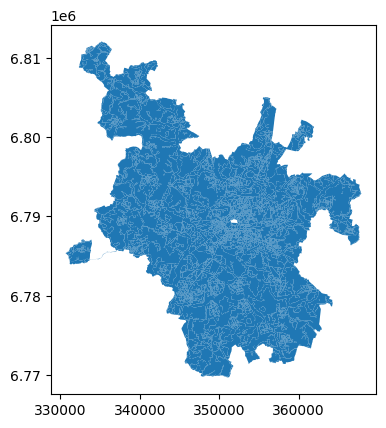

In [ ]:
#Importer le PLU de Rennes Métropole via l'API du GPU
!wget -O PLU.geojson https://apicarto.ign.fr/api/gpu/zone-urba?partition=DU_243500139

#Chargement couche du PLU
PLU= gpd.read_file("PLU.geojson", encoding='utf-8')
PLU = PLU.to_crs("EPSG:2154")
PLU.plot()
PLU.head(3)

## Préparation des couches

In [ ]:
# Vérifier le SCR des couches

Batiments.crs
Parcelles.crs
Sections.crs
PLU.crs

<Projected CRS: EPSG:2154>
Name: RGF93 v1 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France - onshore and offshore, mainland and Corsica (France métropolitaine including Corsica).
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993 v1
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [ ]:
#Créer un ID unique pour chaque batiment (id unique)

Batiments["ID_Bati"] = Batiments.index
Batiments.head()

,commune,nom,type,created,updated,geometry,ID_Bati,Surface_Batiment
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0,100
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6...",1,92
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2,114
3,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357201.063 6790536.791, 357202.418 6...",3,139
4,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357170.131 6790496.341, 357177.821 6...",4,107


In [ ]:
# Créer un ID unique pour chaque parcelle (concaténation de deux champs)

Parcelles["ID_Parcelle"] = Parcelles["prefixe"] + "-" + Parcelles["section"] + "-" + Parcelles["numero"]
Parcelles.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564,23922
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2022-01-28,"POLYGON ((357515.617 6790355.263, 357541.619 6...",000-AA-563,5647


In [ ]:
# Créer un ID unique pour chaque section (concaténation de deux champs)

Sections["ID_Section"] = Sections["prefixe"] + "-" + Sections["code"]
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section,Surface_Section,NbBatis
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6...",000-AA,369064,475
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB,214286,263
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC,142503,112


In [ ]:
# Ajouter une colonne surface aux sections cadastrales (entier)

Sections["Surface_Section"] = Sections['geometry'].area
Sections["Surface_Section"] = Sections["Surface_Section"].astype(int)
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section,Surface_Section,NbBatis
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6...",000-AA,369064,475
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB,214286,263
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC,142503,112


In [ ]:
# Ajouter une colonne surface aux parcelles cadastrales (entier)

Parcelles["Surface_Parcelle"] = Parcelles['geometry'].area
Parcelles["Surface_Parcelle"] = Parcelles["Surface_Parcelle"].astype(int)
Parcelles.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564,23922
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2022-01-28,"POLYGON ((357515.617 6790355.263, 357541.619 6...",000-AA-563,5647


In [ ]:
# Ajouter une colonne surface aux batiments

Batiments["Surface_Batiment"] = Batiments['geometry'].area
Batiments["Surface_Batiment"] = Batiments["Surface_Batiment"].astype(int)
Batiments.head(3)

,commune,nom,type,created,updated,geometry,ID_Bati,Surface_Batiment
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0,100
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6...",1,92
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2,114


<Axes: >

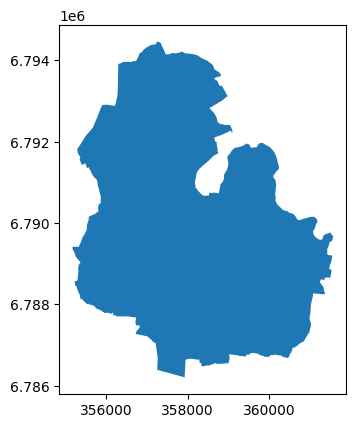

In [ ]:
# Créer une couche avec l'emprise de la commune d'étude

Contours = Sections.dissolve(by="commune")
Contours.plot()

<Axes: >

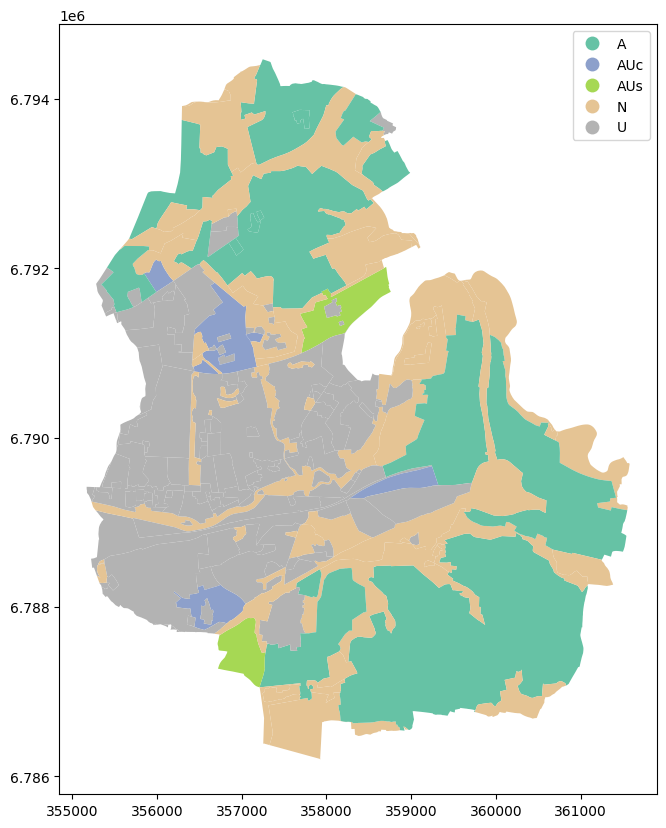

In [ ]:
#Ne garder sur le PLU de la commune
PLUCommune = gpd.overlay(PLU, Contours, how='intersection')
PLUCommune.plot(figsize=(10,10),column='typezone', legend=True, cmap='Set2')


## Analyse spatiale

*   Compter le nombre de bâtiments par section cadastrale
*   Compter le nombre de bâtiments par parcelle cadastrale
*   Calculer la proportion de surface des bâtiments par parcelle cadastrale
*   Compter le nombre de parcelles par type de zonage
*   Compter le nombre de bâtiments par type de zonage

### Compter le nombre de bâtiments par section cadastrale


,commune,nom,type,created,updated,geometry,ID_Bati,Surface_Batiment
0,35051,None,01,2020-06-16,2020-06-22,POINT (357214.927 6790493.368),0,100
1,35051,None,01,2020-06-16,2020-06-22,POINT (357186.831 6790466.391),1,92
2,35051,None,01,2020-06-16,2020-06-22,POINT (357216.900 6790398.322),2,114


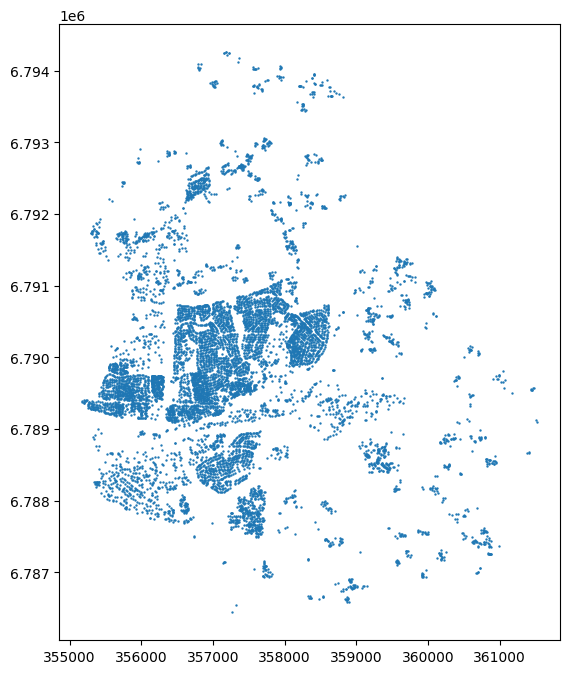

In [ ]:
#Transformer les batiments (polygones) en points (centroides)

BatimentsCentro = Batiments.copy()
BatimentsCentro.geometry = BatimentsCentro['geometry'].centroid
BatimentsCentro.crs =Batiments.crs
BatimentsCentro.plot(figsize=(8,8), markersize=0.5, legend=True)
BatimentsCentro.head(3)

In [ ]:
# Encrichir les batiments des informations de la couche des Sections Cadastrales (jointure spatiale)

BatimentsEtape1 = gpd.sjoin(BatimentsCentro, Sections)
BatimentsEtape1.head(5)

,commune_left,nom,type,created_left,updated_left,geometry,ID_Bati,Surface_Batiment,index_right,id,commune_right,prefixe,code,created_right,updated_right,ID_Section,Surface_Section
0,35051,None,01,2020-06-16,2020-06-22,POINT (357214.927 6790493.368),0,100,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
1,35051,None,01,2020-06-16,2020-06-22,POINT (357186.831 6790466.391),1,92,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
2,35051,None,01,2020-06-16,2020-06-22,POINT (357216.900 6790398.322),2,114,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
3,35051,None,01,2020-06-16,2020-06-22,POINT (357196.770 6790531.821),3,139,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
4,35051,None,01,2020-06-16,2020-06-22,POINT (357176.881 6790496.643),4,107,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064


In [ ]:
#Réorganiser la table

BatimentsEtape2 = BatimentsEtape1[["ID_Bati", "type", "code", "Surface_Batiment", "ID_Section", "Surface_Section", "geometry"]]
BatimentsEtape2.head(3)

,ID_Bati,type,code,Surface_Batiment,ID_Section,Surface_Section,geometry
0,0,01,AA,100,000-AA,369064,POINT (357214.927 6790493.368)
1,1,01,AA,92,000-AA,369064,POINT (357186.831 6790466.391)
2,2,01,AA,114,000-AA,369064,POINT (357216.900 6790398.322)


In [ ]:
# Encrichir les batiments des informations de la couche des parcelles Cadastrales (jointure spatiale)

BatimentsEtape3 = gpd.sjoin(BatimentsEtape2, Parcelles)
BatimentsEtape3.head(3)

,ID_Bati,type,code,Surface_Batiment,ID_Section,Surface_Section,geometry,index_right,id,commune,prefixe,section,numero,contenance,created,updated,ID_Parcelle,Surface_Parcelle
0,0,01,AA,100,000-AA,369064,POINT (357214.927 6790493.368),15,35051000AA0126,35051,000,AA,126,580.0,2020-06-16,2022-01-28,000-AA-126,584
1,1,01,AA,92,000-AA,369064,POINT (357186.831 6790466.391),14,35051000AA0124,35051,000,AA,124,468.0,2020-06-16,2022-01-28,000-AA-124,470
2,2,01,AA,114,000-AA,369064,POINT (357216.900 6790398.322),22,35051000AA0119,35051,000,AA,119,513.0,2020-06-16,2022-01-28,000-AA-119,511


In [ ]:
#Réorganiser la table

BatimentsFinal = BatimentsEtape3[["ID_Bati", "type", "code", "Surface_Batiment", "ID_Section", "Surface_Section", "ID_Parcelle", "Surface_Parcelle", "geometry"]]
BatimentsFinal.head(3)

,ID_Bati,type,code,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,geometry
0,0,01,AA,100,000-AA,369064,000-AA-126,584,POINT (357214.927 6790493.368)
1,1,01,AA,92,000-AA,369064,000-AA-124,470,POINT (357186.831 6790466.391)
2,2,01,AA,114,000-AA,369064,000-AA-119,511,POINT (357216.900 6790398.322)


In [ ]:
# Jointure attributaire pour repasser sur la couche des polygones

BatimentsFinalOk = Batiments.merge(BatimentsFinal, on='ID_Bati')
BatimentsFinalOk.head(3)

,commune,nom,type_x,created,updated,geometry_x,ID_Bati,Surface_Batiment_x,type_y,code,Surface_Batiment_y,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,geometry_y
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0,100,01,AA,100,000-AA,369064,000-AA-126,584,POINT (357214.927 6790493.368)
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6...",1,92,01,AA,92,000-AA,369064,000-AA-124,470,POINT (357186.831 6790466.391)
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2,114,01,AA,114,000-AA,369064,000-AA-119,511,POINT (357216.900 6790398.322)


In [ ]:
#Réorganiser la table
BatimentsFinalOk = BatimentsFinalOk[["ID_Bati", "type_x", "Surface_Batiment_x", "ID_Section", "Surface_Section", "ID_Parcelle", "Surface_Parcelle", "geometry_x"]]
BatimentsFinalOk.rename(columns={'type_x': 'type','Surface_Batiment_x': 'Surface_Batiment','geometry_x': 'Geometry'}, inplace=True)
BatimentsFinalOk.head()

<ipython-input-25-545e0da0ae41>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BatimentsFinalOk.rename(columns={'type_x': 'type','Surface_Batiment_x': 'Surface_Batiment','geometry_x': 'Geometry'}, inplace=True)


,ID_Bati,type,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,Geometry
0,0,01,100,000-AA,369064,000-AA-126,584,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,1,01,92,000-AA,369064,000-AA-124,470,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,2,01,114,000-AA,369064,000-AA-119,511,"POLYGON ((357208.471 6790399.177, 357213.178 6..."
3,3,01,139,000-AA,369064,000-AA-78,669,"POLYGON ((357201.063 6790536.791, 357202.418 6..."
4,4,01,107,000-AA,369064,000-AA-82,577,"POLYGON ((357170.131 6790496.341, 357177.821 6..."


,ID_Bati,type,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,Geometry
0,0,01,100,000-AA,369064,000-AA-126,584,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,1,01,92,000-AA,369064,000-AA-124,470,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,2,01,114,000-AA,369064,000-AA-119,511,"POLYGON ((357208.471 6790399.177, 357213.178 6..."


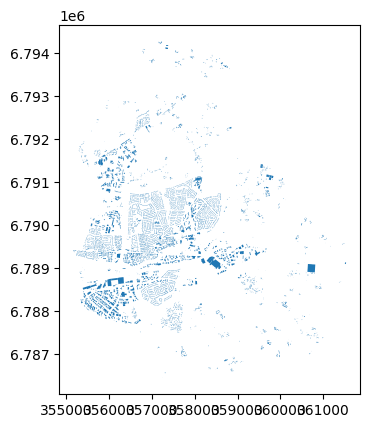

In [ ]:
#Repasser en GeoDataframe

BatiOK = gpd.GeoDataFrame(BatimentsFinalOk, crs="EPSG:2154", geometry='Geometry')
BatiOK.plot()
BatiOK.head(3)


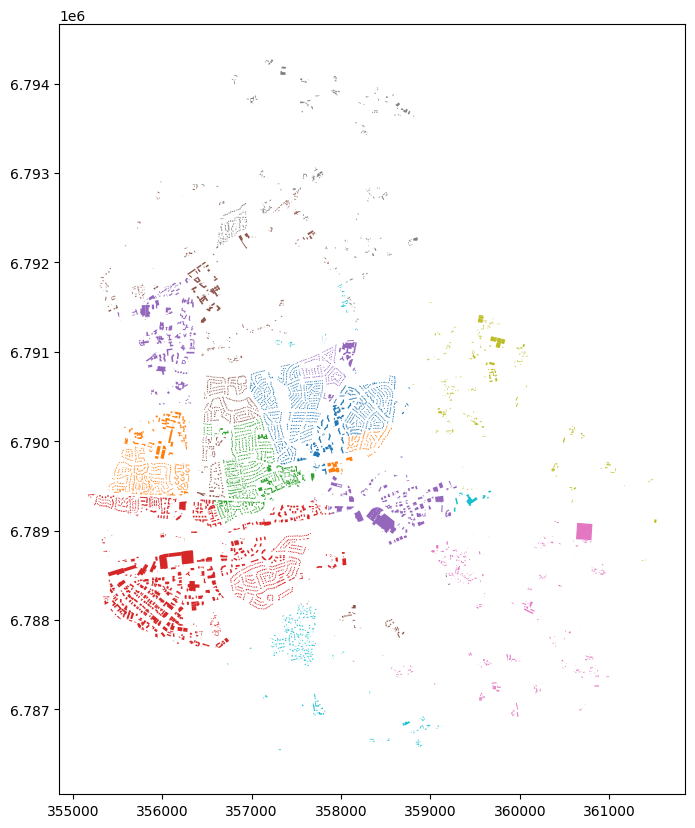

In [ ]:
# Faire une carte des batiments catégorisée par code de section

map2 = BatiOK.plot(figsize=(10,10), column='ID_Section', legend=False).get_figure()

In [ ]:
# Calculer le  nombre de batiments par sections cadastrale

NbBatiSection = BatiOK[["ID_Section", "ID_Bati"]].groupby("ID_Section").size()
NbBatiSection = pd.DataFrame(NbBatiSection)
NbBatiSection = NbBatiSection.rename(columns={0: 'NbBatis'})
NbBatiSection.head(3)

,NbBatis
ID_Section,
000-AA,475
000-AB,263
000-AC,112


In [ ]:
# Compter le nombre de batiment (vérification)

total1 = Batiments['geometry'].count()
total2 = NbBatiSection['NbBatis'].sum()
print(total1)
print(total1)

9044
9044


In [ ]:
# Jointure attributaire pour repasser sur la couche des sections cadastrales

Sections = Sections.merge(NbBatiSection, on='ID_Section')
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section,Surface_Section,NbBatis
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6...",000-AA,369064,475
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB,214286,263
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC,142503,112


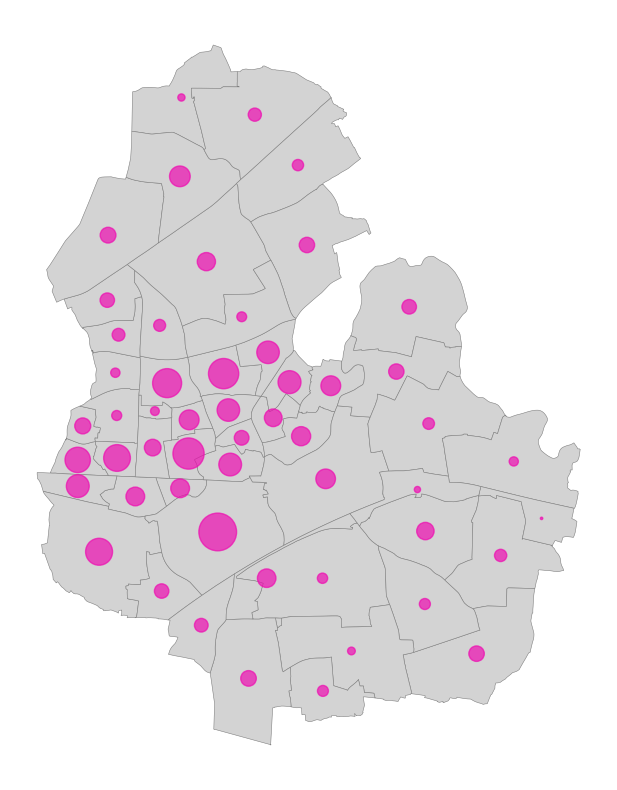

In [ ]:
# Faire une carte pour représenter le nombre de batiments pas section cadastrale

SectionsCentro = Sections.copy()
SectionsCentro.geometry = SectionsCentro['geometry'].centroid

Carte1, ax = plt.subplots(figsize=(10,10))  # Configuration de la carte

Sections.plot(ax=ax, color="lightgray", edgecolor="grey", linewidth=0.4)
SectionsCentro.plot(ax=ax,color="#ee0db1", markersize="NbBatis",alpha=0.7, categorical=False, legend=True)

ax.axis("off")
plt.show()

<Axes: ylabel='Frequency'>

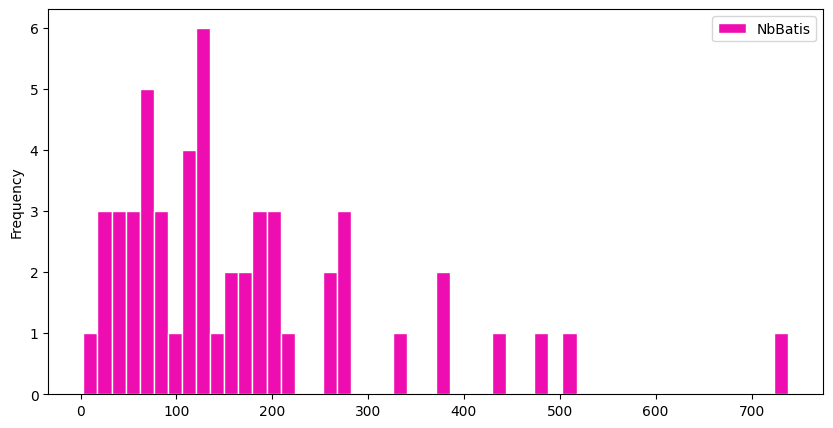

In [ ]:
# Histogramme

NbBatiSection.plot.hist(figsize = (10,5), bins=50, color="#ee0db1", edgecolor='white')

### Compter le nombre de bâtiments par parcelle cadastrale

In [ ]:
# Calculer le Nombre de batiments par parcelle cadastrale

NbBatiParcelle  = BatiOK[["ID_Parcelle", "ID_Bati"]].groupby("ID_Parcelle").size()
NbBatiParcelle =pd.DataFrame(NbBatiParcelle)
NbBatiParcelle = NbBatiParcelle.rename(columns={0: 'NbBatis'})
NbBatiParcelle.head(5)

,NbBatis
ID_Parcelle,
000-AA-10,2
000-AA-100,1
000-AA-101,1
000-AA-102,1
000-AA-103,1


In [ ]:
# Compter le nombre de batiment

total1 = Batiments['geometry'].count()
total2 = NbBatiParcelle['NbBatis'].sum()
print(total1)
print(total1)

9044
9044


In [ ]:
# Jointure attributaire pour repasser sur la couche des parcelles  cadastrales

Parcellesbis = Parcelles.merge(NbBatiParcelle, on='ID_Parcelle')
Parcellesbis.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle,NbBatis
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589,1
1,35051000AA0192,35051,000,AA,192,6752.0,2020-06-16,2022-01-28,"POLYGON ((357526.866 6790865.979, 357527.840 6...",000-AA-192,6609,1
2,35051000AA0059,35051,000,AA,59,619.0,2020-06-16,2022-01-28,"POLYGON ((357024.044 6790482.974, 357016.068 6...",000-AA-59,621,1


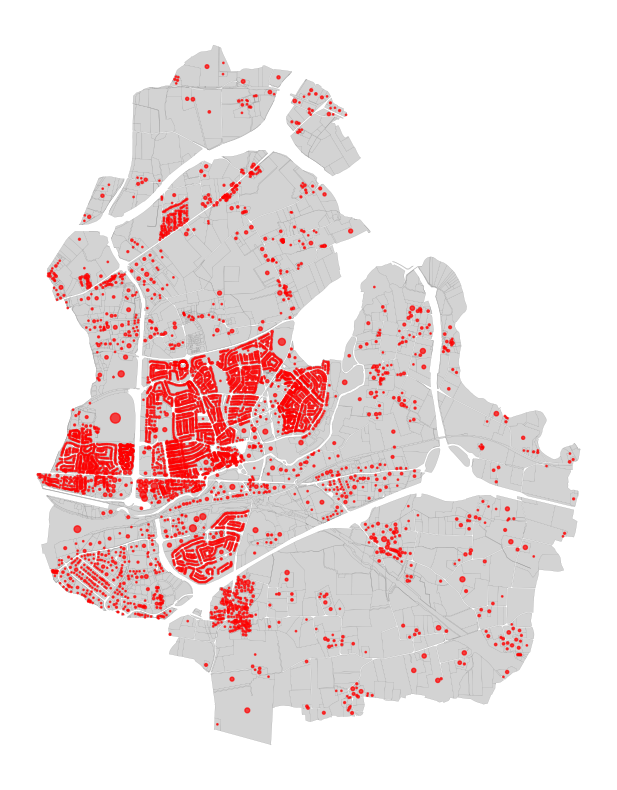

In [ ]:
# Faire une carte pour représenter le nombre de batiments par parcelle cadastrale

Parcellescentro = Parcellesbis.copy()
Parcellescentro.geometry = Parcellescentro['geometry'].centroid

Carte1, ax = plt.subplots(figsize=(10,10))  # Configuration de la carte

Parcelles.plot(ax=ax, color="lightgray", edgecolor="grey", linewidth=0.1)
Parcellescentro.plot(ax=ax, markersize="NbBatis", color='red', alpha=0.7, legend=True)

ax.axis("off")
plt.show()

<Axes: ylabel='Frequency'>

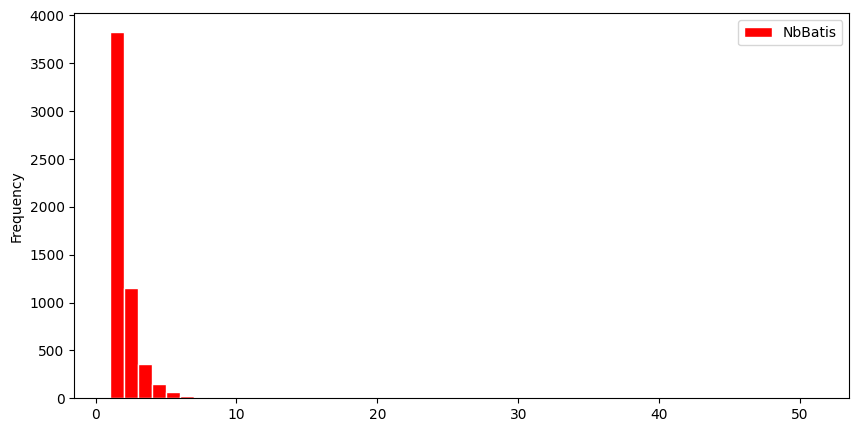

In [ ]:
#Histogramme

NbBatiParcelle.plot.hist(figsize = (10,5), bins=50, color='red', edgecolor='white')

### Calculer la proportion de surface des bâtiments par parcelle cadastrale (tx de recouvrement)

In [ ]:
BatiOK.head(3)

,ID_Bati,type,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,Geometry
0,0,01,100,000-AA,369064,000-AA-126,584,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,1,01,92,000-AA,369064,000-AA-124,470,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,2,01,114,000-AA,369064,000-AA-119,511,"POLYGON ((357208.471 6790399.177, 357213.178 6..."


In [ ]:
# Calculer la proportion des surfaces baties par parcelle cadastrale

recap = BatiOK.groupby('ID_Parcelle').agg({'Surface_Batiment':'sum','Surface_Parcelle':'max'})
recap["propbatiparcelle"] = recap["Surface_Batiment"] / recap["Surface_Parcelle"] *100
recap.head()

,Surface_Batiment,Surface_Parcelle,propbatiparcelle
ID_Parcelle,,,
000-AA-10,99,796,12.437186
000-AA-100,84,421,19.952494
000-AA-101,139,644,21.583851
000-AA-102,111,528,21.022727
000-AA-103,91,606,15.016502


In [ ]:
# Faire la jointure attributaire avec la couche des parcelles cadastrales et la carte

Parcellesok = Parcellesbis.merge(recap, on='ID_Parcelle')
Parcellesok.head()

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle_x,NbBatis,Surface_Batiment,Surface_Parcelle_y,propbatiparcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589,1,8,42589,0.018784
1,35051000AA0192,35051,000,AA,192,6752.0,2020-06-16,2022-01-28,"POLYGON ((357526.866 6790865.979, 357527.840 6...",000-AA-192,6609,1,7,6609,0.105916
2,35051000AA0059,35051,000,AA,59,619.0,2020-06-16,2022-01-28,"POLYGON ((357024.044 6790482.974, 357016.068 6...",000-AA-59,621,1,125,621,20.128824
3,35051000AA0553,35051,000,AA,553,1290.0,2020-06-16,2022-01-28,"POLYGON ((357028.302 6790578.606, 357025.147 6...",000-AA-553,1287,2,433,1287,33.644134
4,35051000AA0137,35051,000,AA,137,610.0,2020-06-16,2022-01-28,"POLYGON ((357264.528 6790536.956, 357247.448 6...",000-AA-137,609,1,140,609,22.988506


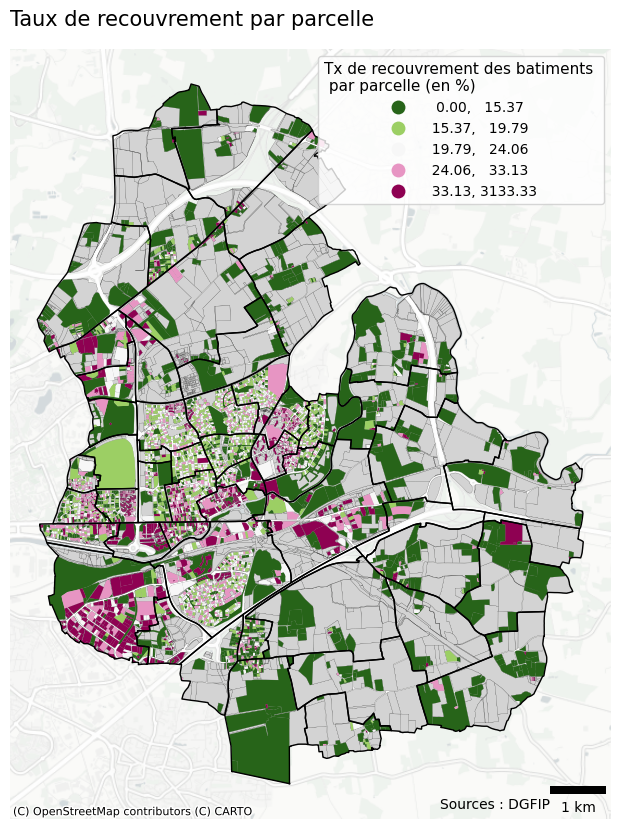

In [ ]:
Carte1, ax = plt.subplots(figsize=(10,10))

Sections.to_crs('EPSG:3857').boundary.plot(ax=ax, edgecolor="black", linewidth=1)
Parcelles.to_crs('EPSG:3857').plot(ax=ax, color="lightgray", edgecolor="black", linewidth=0.1)
Parcellesok.to_crs('EPSG:3857').plot(ax=ax, column='propbatiparcelle', cmap='PiYG_r', scheme='quantiles', legend=True,
                                     legend_kwds={'title': "Tx de recouvrement des batiments \n par parcelle (en %)", 'loc': 'upper right', 'title_fontsize': 11, 'fontsize': 10})

ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.title('Taux de recouvrement du bati par parcelle', loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : DGFIP', verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location="lower right", box_alpha=0, color="black"))

plt.show()

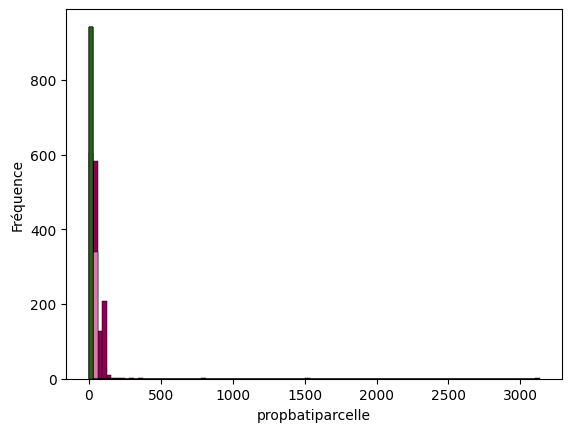

In [ ]:
# Histogramme en fonction de la discrétisation de la carte

import seaborn as sns

# Nombre de quantiles
num_quantiles = 6

# Calculer les quantiles
quantiles = pd.qcut(Parcellesok['propbatiparcelle'], num_quantiles, labels=False)

# Tracer l'histogramme avec des couleurs de quantiles en utilisant Seaborn
sns.histplot(data=Parcellesok, x='propbatiparcelle', bins=100, hue=quantiles, palette='PiYG_r',  alpha=1, legend=False)

# Définir les étiquettes des axes
plt.xlabel("propbatiparcelle")
plt.ylabel("Fréquence")

# Afficher le graphe
plt.show()

### Compter le nombre de parcelles par type de zonage

,id,commune,prefixe_left,section,numero,contenance,created_left,updated_left,geometry,ID_Parcelle,...,idzone,lib_idzone,id_2,prefixe_right,code,created_right,updated_right,ID_Section,Surface_Section,NbBatis
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,...,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064,475
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564,...,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064,475


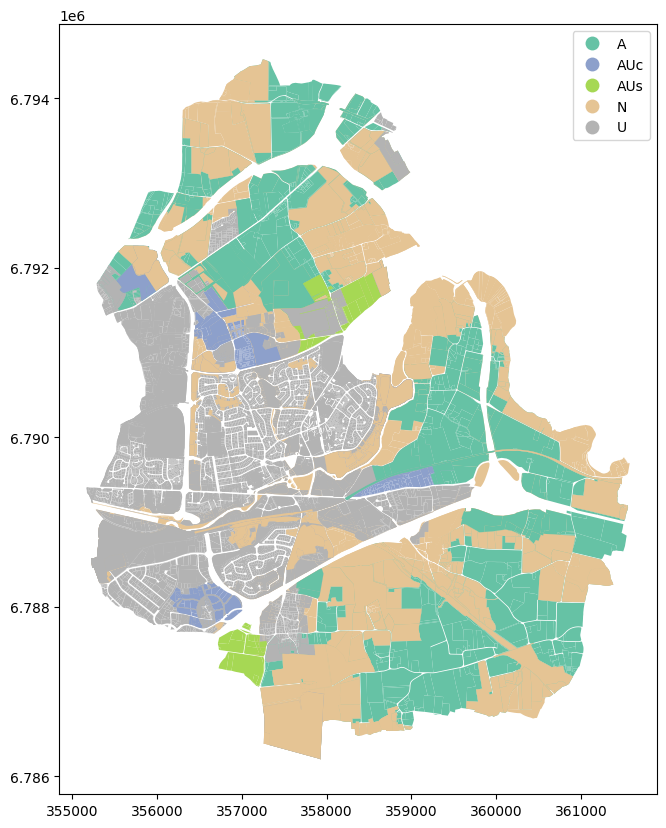

In [ ]:
# Encrichir les batiments des informations de la couche PLU (jointure spatiale)

ParcellesPLU = gpd.sjoin(Parcelles, PLUCommune)
ParcellesPLU.plot(figsize=(10,10),column='typezone', legend=True, cmap='Set2')
ParcellesPLU.head(2)

,id
typezone,
A,1306
AUc,436
AUs,89
N,1737
U,8257


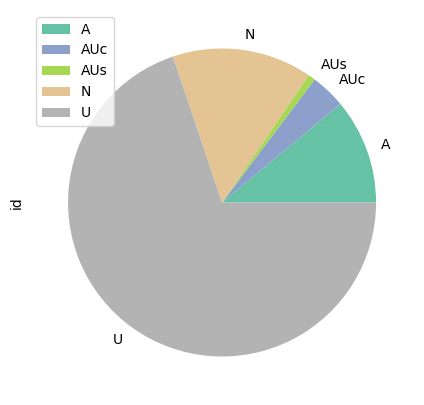

In [ ]:
# Graphique du nombre de parcelles par zonage

Categorie = ParcellesPLU[["typezone", "id"]].groupby("typezone").count()
Categorie.plot.pie(figsize =(14,5), y="id", cmap='Set2')
Categorie.head()

### Compter le nombre de bâtiments par type de zonage

In [ ]:
# Encrichir les batiments des informations de la couche PLU (jointure spatiale)

BatimentsPLU = gpd.sjoin(Batiments, PLUCommune)
BatimentsPLU.plot(figsize=(10,10),column='typezone', legend=True, cmap='Set2')
BatimentsPLU.head(2)

In [ ]:
# Graphique du nombre de bâtiments par zonage

Categorie = BatimentsPLU[["typezone", "ID_Bati"]].groupby("typezone").count()
Categorie.plot.pie(figsize =(14,5), y="ID_Bati", cmap='Set2')
Categorie.head()


## Cartographie du risque d'innondation

### Préparation des couches

In [ ]:
#Téléchargement des datas depuis le portail opendata de Rennes
!wget -O hydrographie.geojson https://data.rennesmetropole.fr/explore/dataset/reseau_hydrographique/download/?format=geojson&timezone=Europe/Berlin&lang=fr

--2024-03-19 08:54:41--  https://data.rennesmetropole.fr/explore/dataset/reseau_hydrographique/download/?format=geojson
Resolving data.rennesmetropole.fr (data.rennesmetropole.fr)... 34.249.199.226, 34.248.20.69
Connecting to data.rennesmetropole.fr (data.rennesmetropole.fr)|34.249.199.226|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘hydrographie.geojson’

hydrographie.geojso     [              <=>   ]  16.48M  3.32MB/s    in 5.0s    

2024-03-19 08:54:47 (3.32 MB/s) - ‘hydrographie.geojson’ saved [17284736]



,gml_id,hydro_code_insee,deno_hydro_id,objectid,type_hydro_id,type_hydro_nom,deno_hydr_nom,ope_id,hydro_date_maj,hydro_visible,geometry
0,v_hydro.1112,35099.0,1.0,1112,5,ruisseau,None,1.0,NaT,1,"POLYGON ((357989.641 6771175.078, 357995.861 6..."
1,v_hydro.1161,35069.0,1.0,1161,2,étang,None,1.0,NaT,1,"POLYGON ((358227.898 6785710.503, 358205.337 6..."
2,v_hydro.1706,35206.0,1.0,1706,2,étang,None,1.0,NaT,1,"POLYGON ((360845.295 6775964.375, 360845.121 6..."


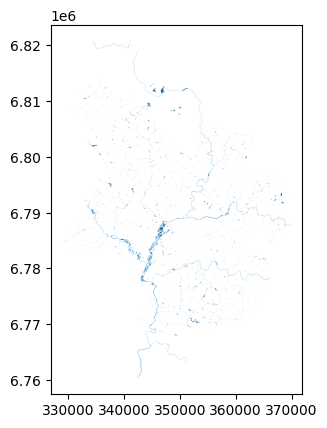

In [ ]:
#Chargement couche hydrographie

Hydrographie= gpd.read_file("hydrographie.geojson", encoding='utf-8')
Hydrographie = Hydrographie.to_crs("EPSG:2154")
Hydrographie.plot()
Hydrographie.head(3)

<Axes: >

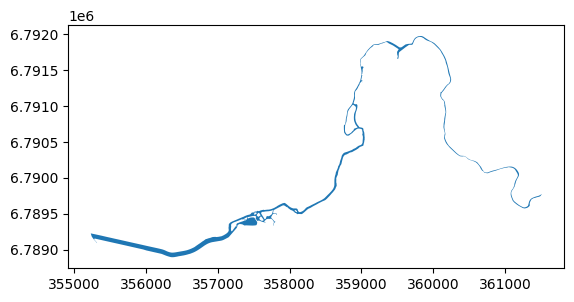

In [ ]:
# Ne garder que les troncons de type "fleuve" dans la commune d'étude

Fleuve = Hydrographie[(Hydrographie["type_hydro_nom"] == 'fleuve')]
Hydrocommunetrace = gpd.overlay(Fleuve, Contours, how='intersection')
Hydrocommunetrace.plot()

<Axes: >

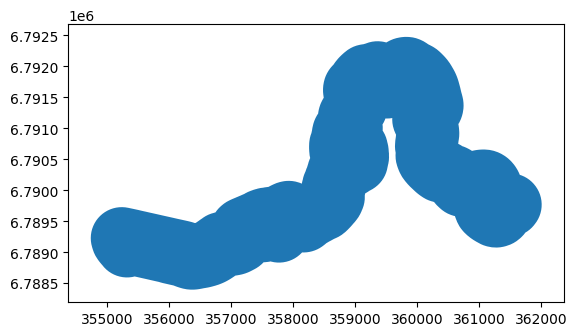

In [ ]:
#Faire un buffer de 500m autour de la couche hydro
Hydrocommune = Hydrocommunetrace.copy()
Hydrocommune['geometry'] = Hydrocommune['geometry'].buffer(500)
Hydrocommune = Hydrocommune.dissolve(by ='deno_hydr_nom')
Hydrocommune.plot()

<Axes: >

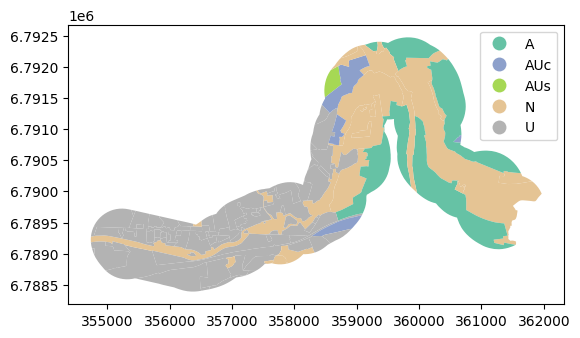

In [ ]:
# Garder le zonage situés à moins de 500m de la Vilaine
Zonagerisque = gpd.overlay(PLU, Hydrocommune, how='intersection')
Zonagerisque.plot(column = 'typezone', legend = True, cmap='Set2')

<Axes: >

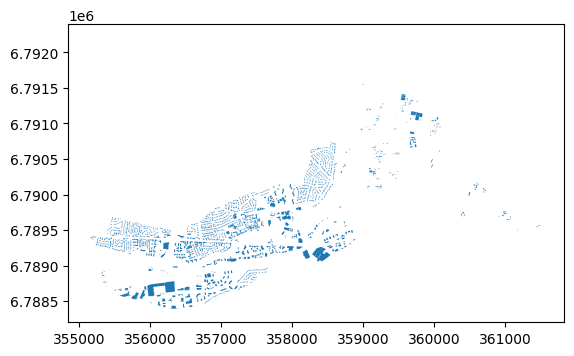

In [ ]:
# Garder les bâtiments situés à moins de 500m de la Vilaine

Batirisque = gpd.overlay(Batiments, Hydrocommune, how='intersection')
Batirisque.plot()

### Cartographie

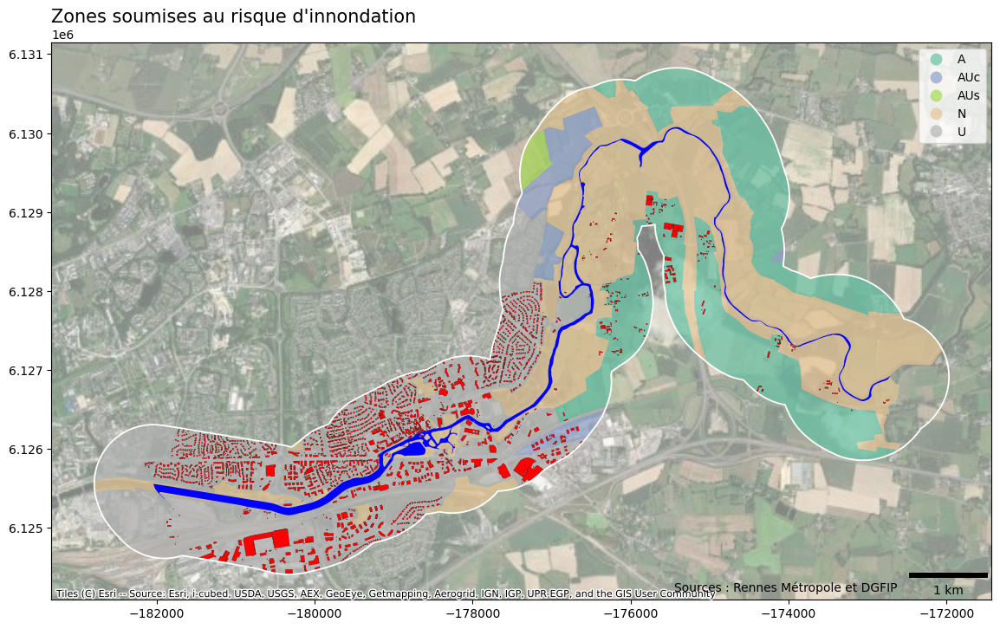

In [ ]:
#Carte récapitulative

Carte1, ax = plt.subplots(figsize=(14,14))
Hydrocommune.boundary.to_crs('EPSG:3857').plot(ax=ax, edgecolor="white", linewidth=1.3)
Zonagerisque.to_crs('EPSG:3857').plot(ax = ax, column = 'typezone', legend = True, alpha=0.7, cmap='Set2')
Batirisque.to_crs('EPSG:3857').plot(ax=ax, color="red", edgecolor="black", linewidth=0.15)
Hydrocommunetrace.to_crs('EPSG:3857').plot(ax=ax, color="blue",linewidth=5)

ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, alpha=0.5)

plt.title("Zones soumises au risque d'innondation", loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : Rennes Métropole et DGFIP', verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location="lower right", box_alpha=0, color="black"))

plt.show()

# Applicatif : indicateur d'urbanisation à l'échelle d'un département

### Préparation des données


In [ ]:
#Téléchargement des datas depuis cadastre.data.gouv

!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/batiments -O batiments.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/communes -O communes.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/sections -O sections.zip

--2024-03-18 12:21:45--  https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/batiments
Resolving cadastre.data.gouv.fr (cadastre.data.gouv.fr)... 54.36.212.78
Connecting to cadastre.data.gouv.fr (cadastre.data.gouv.fr)|54.36.212.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16322835 (16M) [application/x-shapefile]
Saving to: ‘batiments.zip’

batiments.zip       100%[===================>]  15.57M  8.79MB/s    in 1.8s    

2024-03-18 12:21:48 (8.79 MB/s) - ‘batiments.zip’ saved [16322835/16322835]

--2024-03-18 12:21:48--  https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/communes
Resolving cadastre.data.gouv.fr (cadastre.data.gouv.fr)... 54.36.212.78
Connecting to cadastre.data.gouv.fr (cadastre.data.gouv.fr)|54.36.212.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2052243 (2.0M) [application/x-shapefile]
Saving to: ‘communes.zip’

communes.zip        100%[===================>]   1

In [ ]:
#Chargement couche batiment (environ 3mn)
batiments= gpd.read_file("batiments.zip")
batiments.head(3)

,commune,nom,type,created,updated,geometry
0,05003,None,02,2006-11-26,2014-02-14,"POLYGON ((1004394.633 6419015.473, 1004395.489..."
1,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004471.541 6418962.558, 1004471.602..."
2,05003,None,01,2015-01-29,2015-01-29,"POLYGON ((1004472.347 6418979.767, 1004472.941..."


In [ ]:
batiments['commune'].count()

168340

In [ ]:
#Chargement couche communes
communes= gpd.read_file("communes.zip", encoding='utf-8')
communes.head(3)

,id,nom,created,updated,geometry
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401..."
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6..."
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6..."


In [ ]:
len(communes)

162

In [ ]:
#Chargement couche sections
sections= gpd.read_file("sections.zip", encoding='utf-8')
sections.head(3)

,id,commune,prefixe,code,created,updated,geometry
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400..."
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177..."
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601..."


In [ ]:
len(sections)

1556

In [ ]:
# Ajouter des index spatiaux aux couches

batiments.sindex
communes.sindex
sections.sindex

### Exercice à l'échelle des communes


In [ ]:
# Calculer la surface des bâtiments

batiments["Surface_batiments"] = batiments['geometry'].area
batiments['Surface_batiments']=batiments['Surface_batiments'].astype(int)
batiments.head()

,commune,nom,type,created,updated,geometry,Surface_batiments
0,05003,None,02,2006-11-26,2014-02-14,"POLYGON ((1004394.633 6419015.473, 1004395.489...",0
1,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004471.541 6418962.558, 1004471.602...",20
2,05003,None,01,2015-01-29,2015-01-29,"POLYGON ((1004472.347 6418979.767, 1004472.941...",43
3,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004532.999 6418976.045, 1004528.888...",47
4,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004507.287 6419001.468, 1004511.479...",75


In [ ]:
# Calculer la somme des surfaces des bâtiments par commune

SurfaceBatisCommunes = batiments.groupby('commune').agg({'Surface_batiments':'sum'})
SurfaceBatisCommunes.head()

,Surface_batiments
commune,
05001,71846
05003,50215
05004,167786
05006,200459
05007,81251


In [ ]:
# Calculer la surface des communes

communes["Surface_commune"] = communes['geometry'].area
communes["Surface_commune"]= communes["Surface_commune"].astype(int)
communes.head()

,id,nom,created,updated,geometry,Surface_commune
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6...",2937409
3,05037,CHATEAUVIEUX,2006-10-16,2023-02-02,"POLYGON ((942776.970 6378561.281, 942753.898 6...",7188870
4,05046,EMBRUN,2006-12-19,2019-04-03,"POLYGON ((977737.159 6388707.825, 977683.478 6...",36480523


In [ ]:
# Jointure attributaire pour enrichir la couche des communes

communes = communes.merge(SurfaceBatisCommunes,left_on='id', right_on='commune')
communes.head()

,id,nom,created,updated,geometry,Surface_commune,Surface_batiments
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501,50215
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768,46466
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6...",2937409,26392
3,05037,CHATEAUVIEUX,2006-10-16,2023-02-02,"POLYGON ((942776.970 6378561.281, 942753.898 6...",7188870,79065
4,05046,EMBRUN,2006-12-19,2019-04-03,"POLYGON ((977737.159 6388707.825, 977683.478 6...",36480523,475616


In [ ]:
# Créer l'indicateur de tx de recouvrement des batimenst

communes["indic"] = communes["Surface_batiments"] / communes["Surface_commune"]*100
communes.head(3)

,id,nom,created,updated,geometry,Surface_commune,Surface_batiments,indic
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501,50215,0.122591
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768,46466,0.512600
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6...",2937409,26392,0.898479


Text(0.0, 1.0, 'Taux de recouvrement des bâtiments dans le 35')

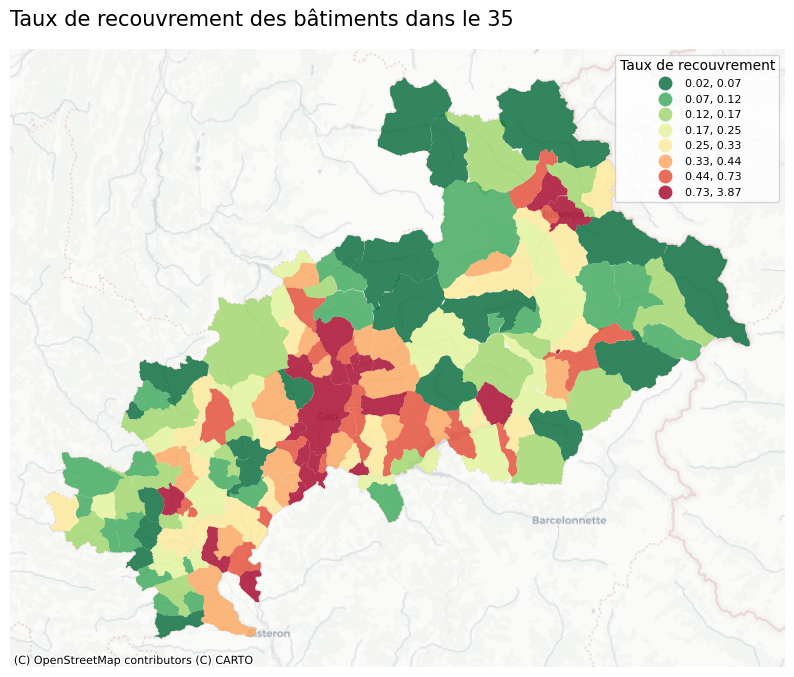

In [ ]:
# Faire la carte

Carte1, ax = plt.pyplot.subplots(figsize=(10,10))

communes.to_crs('EPSG:3857').plot(ax=ax, k=8, column="indic", cmap='RdYlGn_r',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux de recouvrement", 'loc': 'upper right', 'title_fontsize':10, 'fontsize':8})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.pyplot.title("Taux de recouvrement des bâtiments dans le 35", loc='left', fontsize=15)


### Exercice à l'échelle des sections cadastrale


In [ ]:
# Calculer la surface des sections

sections["Surface_sections"] = sections['geometry'].area
sections["Surface_sections"]= sections["Surface_sections"].astype(int)
sections.head()

,id,commune,prefixe,code,created,updated,geometry,Surface_sections
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400...",12839552
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177...",1610471
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321
3,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6...",2581147
4,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.780, 968869.928 6...",13200604


In [ ]:
# Faire la jointure spatiale entre les batiments et les sections

BatimentsCentro = batiments.copy()
BatimentsCentro.geometry = BatimentsCentro['geometry'].centroid

Batimentssections = gpd.sjoin(BatimentsCentro, sections)
Batimentssections.head(3)

,commune_left,nom,type,created_left,updated_left,geometry,Surface_batiments,index_right,id,commune_right,prefixe,code,created_right,updated_right,Surface_sections
0,05003,None,02,2006-11-26,2014-02-14,POINT (1004395.334 6419015.429),0,2,050030000A,05003,000,A,2006-11-26,2014-02-14,5100321
1,05003,None,01,2006-11-13,2014-02-14,POINT (1004468.137 6418962.664),20,2,050030000A,05003,000,A,2006-11-26,2014-02-14,5100321
2,05003,None,01,2015-01-29,2015-01-29,POINT (1004469.608 6418975.951),43,2,050030000A,05003,000,A,2006-11-26,2014-02-14,5100321


In [ ]:
# Calculer la somme des surfaces des bâtiments par sections cadastrales

SurfaceBatisSections= Batimentssections.groupby('id').agg({'Surface_batiments':'sum'})
SurfaceBatisSections.head()

,Surface_batiments
id,
050010000A,615
050010000B,142
050010000C,193
050010000D,4999
050010000E,165


In [ ]:
# Jointure attributaire pour enrichir la couche des communes

sections = sections.merge(SurfaceBatisSections,left_on='id', right_on='id')
sections.head()

,id,commune,prefixe,code,created,updated,geometry,Surface_sections,Surface_batiments
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400...",12839552,615
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177...",1610471,142
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321,401
3,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6...",2581147,23066
4,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.780, 968869.928 6...",13200604,226


In [ ]:
# Créer l'indicateur de tx de recouvrement des batimenst

sections["indic"] = sections["Surface_batiments"] / sections["Surface_sections"]*100
sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,Surface_sections,Surface_batiments,indic
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400...",12839552,615,0.004790
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177...",1610471,142,0.008817
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321,401,0.007862


Text(0.0, 1.0, 'Taux de recouvrement des bâtiments dans le 35')

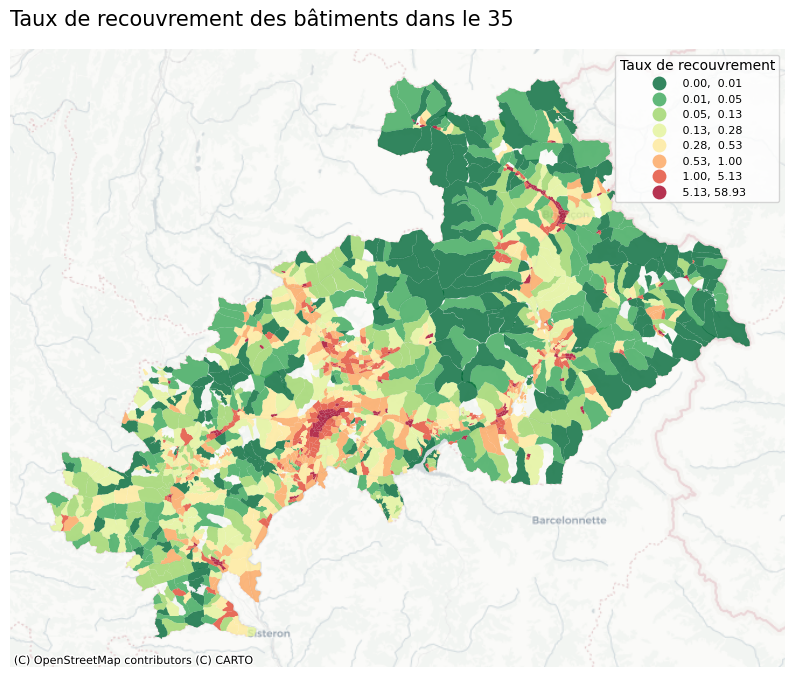

In [ ]:
# Faire la carte

Carte1, ax = plt.pyplot.subplots(figsize=(10,10))

sections.to_crs('EPSG:3857').plot(ax=ax, k=8, column="indic", cmap='RdYlGn_r',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux de recouvrement", 'loc': 'upper right', 'title_fontsize':10, 'fontsize':8})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.pyplot.title("Taux de recouvrement des bâtiments dans le 35", loc='left', fontsize=15)
